In [43]:
import pandas as pd

In [44]:
import geopandas as gpd

In [45]:
# to give more power to your figures (plots)
import matplotlib.pyplot as plt

import contextily as ctx

In [46]:
import numpy as np

In [47]:
import plotly.express as px

In [27]:
oil = pd.read_csv('data/kern_county_oil.csv')
oil

,LeaseName,WellDesign,WellStatus,WellType,WellTypeLa,OperatorNa,Place,CountyName,Latitude,Longitude,GISSource,isDirectio,WellSymbol
0,Southern Pacific,Southern Pacific 11H,Canceled,OG,Oil & Gas,California Resources Production Corporation,Kern County,Kern,35.401291,-118.860405,Operator,N,CanceledOG
1,Siegfus,Siegfus 31X-22,Canceled,OG,Oil & Gas,California Resources Production Corporation,Kern County,Kern,35.397495,-118.855888,Operator,N,CanceledOG
2,Southern Pacific,Southern Pacific 5H,Canceled,OG,Oil & Gas,"Stockdale Oil & Gas, Inc.",Kern County,Kern,35.404583,-118.850471,mip,N,CanceledOG
3,Southern Pacific,Southern Pacific 6H,Canceled,OG,Oil & Gas,"Stockdale Oil & Gas, Inc.",Kern County,Kern,35.403610,-118.849937,mip,N,CanceledOG
4,Southern Pacific,Southern Pacific 7H,Canceled,OG,Oil & Gas,"Stockdale Oil & Gas, Inc.",Kern County,Kern,35.405106,-118.856483,mip,N,CanceledOG
...,...,...,...,...,...,...,...,...,...,...,...,...,...
156308,Tenneco-Texaco Langer et al,Tenneco-Texaco Langer et al 85,Plugged,OG,Oil & Gas,California Resources Production Corporation,Kern County,Kern,35.053963,-119.208061,hud,N,PluggedOG
156309,Yowlumne Unit A,Yowlumne Unit A 85X-11,Plugged,OG,Oil & Gas,California Resources Production Corporation,Kern County,Kern,35.054073,-119.191025,hud,N,PluggedOG
156310,Yowlumne Unit A,Yowlumne Unit A 87X-11,Plugged,OG,Oil & Gas,California Resources Production Corporation,Kern County,Kern,35.050400,-119.190819,GPS,N,PluggedOG
156311,Yowlumne Jamison,Yowlumne Jamison 88-10,Plugged,OG,Oil & Gas,California Resources Production Corporation,Kern County,Kern,35.048664,-119.208069,Operator,N,PluggedOG


In [48]:
oilsubset = oil[['WellStatus', 'WellTypeLa','CountyName','Latitude','Longitude','WellSymbol']]

In [49]:
#this is taking out 'Canceled' wells from the dataset as these will be less important for understanding pollution sources
oilsubset = oilsubset[oilsubset.WellStatus != 'Canceled']
oilsubset.shape

(147958, 6)

In [50]:
gdfoil = gpd.GeoDataFrame(
    oilsubset, geometry = gpd.points_from_xy(oilsubset.Longitude,oilsubset.Latitude),crs = "EPSG:4326")

In [31]:
gdfoil

,WellStatus,WellTypeLa,CountyName,Latitude,Longitude,WellSymbol,geometry
7,Idle,Oil & Gas,Kern,35.402748,-118.857201,IdleOG,POINT (-118.85720 35.40275)
8,Idle,Oil & Gas,Kern,35.397060,-118.860001,IdleOG,POINT (-118.86000 35.39706)
9,Idle,Oil & Gas,Kern,35.393887,-118.860725,IdleOG,POINT (-118.86073 35.39389)
10,Idle,Oil & Gas,Kern,35.397015,-118.858070,IdleOG,POINT (-118.85807 35.39701)
11,Idle,Oil & Gas,Kern,35.395214,-118.860275,IdleOG,POINT (-118.86028 35.39521)
...,...,...,...,...,...,...,...
156308,Plugged,Oil & Gas,Kern,35.053963,-119.208061,PluggedOG,POINT (-119.20806 35.05396)
156309,Plugged,Oil & Gas,Kern,35.054073,-119.191025,PluggedOG,POINT (-119.19102 35.05407)
156310,Plugged,Oil & Gas,Kern,35.050400,-119.190819,PluggedOG,POINT (-119.19082 35.05040)
156311,Plugged,Oil & Gas,Kern,35.048664,-119.208069,PluggedOG,POINT (-119.20807 35.04866)


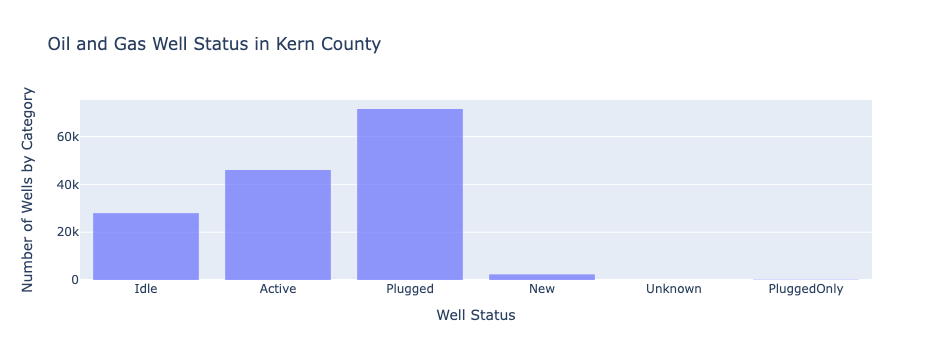

In [32]:
fig = px.bar(
        gdfoil,
        x='WellStatus',
        title='Oil and Gas Well Status in Kern County',
        labels={ #this changes variable name
            'WellStatus':'Well Status', 
            'count':'Number of Wells by Category'
        }
)

# get rid of white lines inside the bars
fig.update_traces(marker_line_width=0)

# show the figure
fig.show()

In [33]:
# show me distinct value of charges
gdfoilstatus = gdfoil.value_counts('WellStatus').reset_index(name='count')


In [34]:
gdfoilstatus

,WellStatus,count
0,Plugged,71548
1,Active,46049
2,Idle,27930
3,New,2251
4,PluggedOnly,147
5,Unknown,33


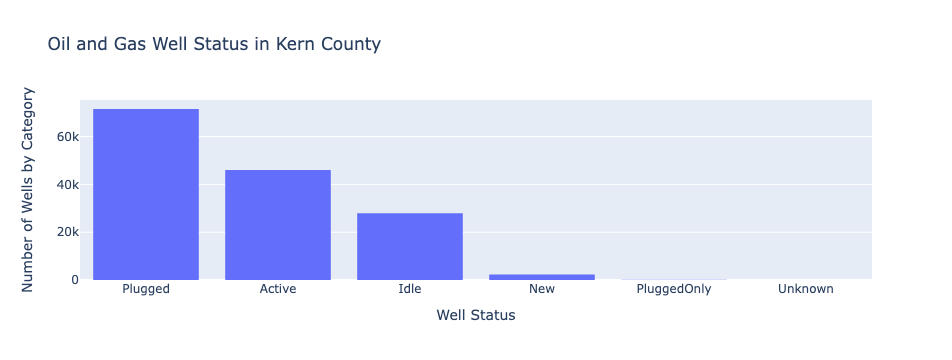

In [35]:
#this makes it interactive to hover on the bars and see the exact number 
fig = px.bar(
        gdfoilstatus,
        x='WellStatus',
        y='count',
        title='Oil and Gas Well Status in Kern County',
        labels={ #this changes variable name
            'WellStatus':'Well Status', 
            'count':'Number of Wells by Category'
        }
)

# get rid of white lines inside the bars
fig.update_traces(marker_line_width=0)

# show the figure
fig.show()

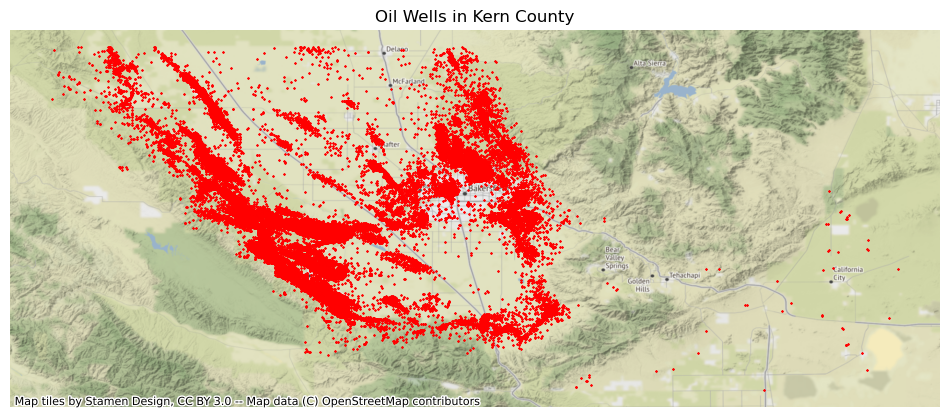

In [36]:
# start the plot. Puts it into two variables fig and ax
fig, ax = plt.subplots(figsize=(12,12))

# add the data options
#gdf is the data. Then you put it in the ax plot with the parameters of
#markersize 10 etc. 
gdfoil.plot(ax=ax, 
        marker='X',
        markersize=.5,
        color='red')

# turn the axes off
ax.axis('off')

# give it a title
ax.set_title('Oil Wells in Kern County')

# add a basemap
ctx.add_basemap(ax, crs=4326) # note that we must specify the projection here (crs)

In [37]:
pollute = ["Active", "Idle", "New"]
pollute

['Active', 'Idle', 'New']

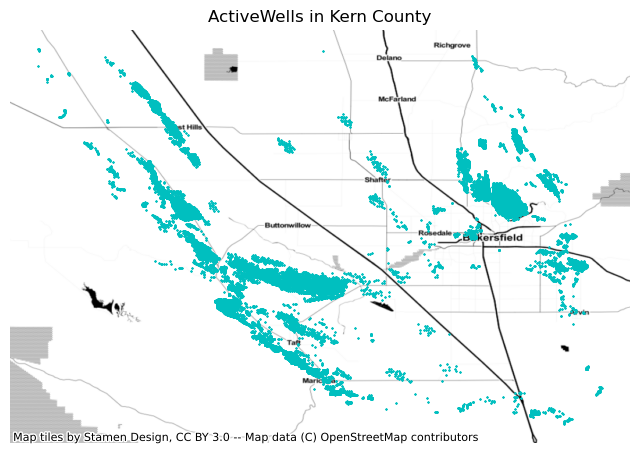

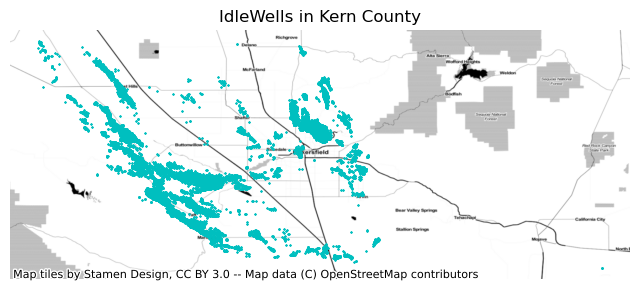

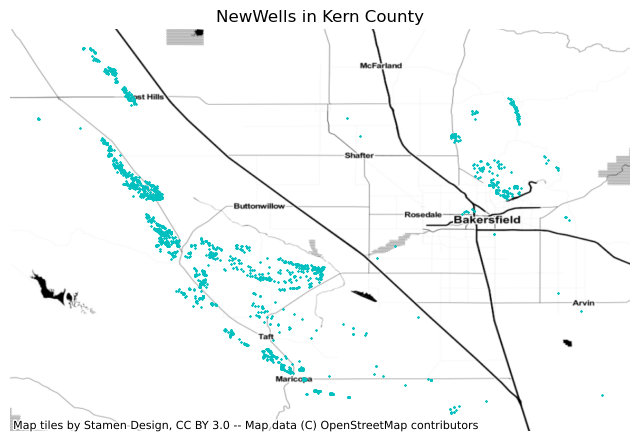

In [38]:
# loop through cities
# this is a "for loop"
#cities becomes variable you use inside loop
# using a colon makes sure everything after is included in the loop
for WellStatus in pollute:

    # map it
    fig, ax = plt.subplots(figsize=(8,8))

    # map options: notice the query to filter by individual city. Instead of gdf.plot it is gdf.city=city.
    #city = city actually means city = cities variable.
    #to add a layer just duplicate below code (from gdf to red) and then can change the parameters of it
    gdfoil[gdfoil.WellStatus == WellStatus].plot(ax=ax, 
                          marker='X',
                          markersize=.5,
                          color="c")
    

    # no axes
    ax.axis('off')

    # title
    ax.set_title(str(WellStatus)+ 
                  'Wells in Kern County')


    #basemap
    ctx.add_basemap(ax, source=ctx.providers.Stamen.Toner, crs=4326)

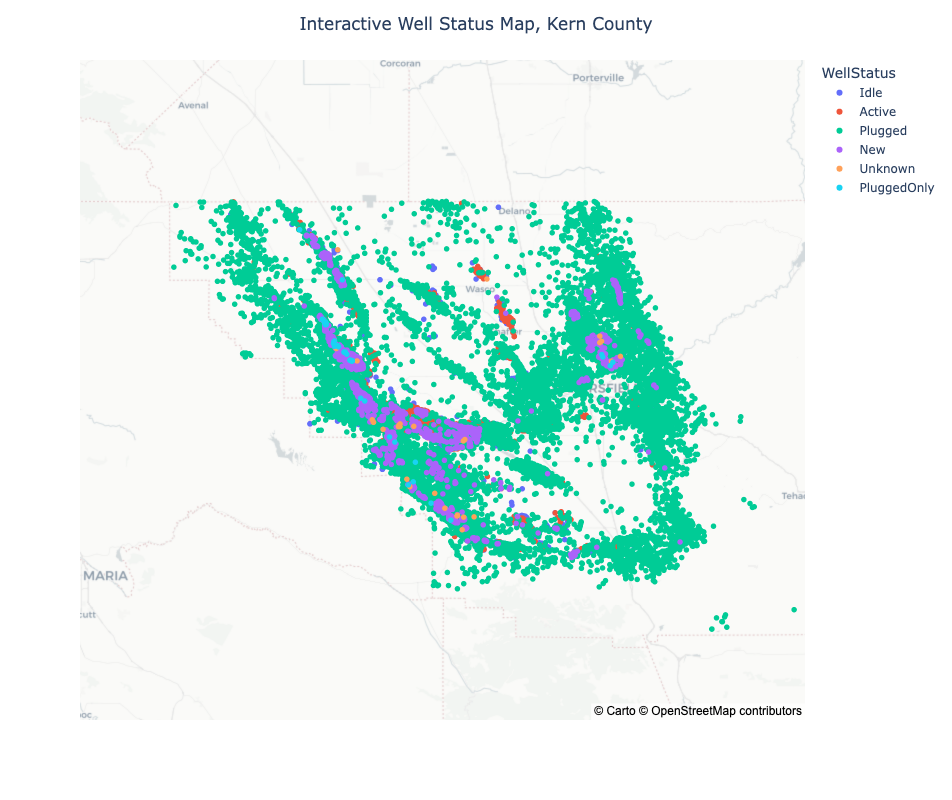

In [39]:
#for plotlymap you can use different base maps than contextily
#can't figure out how to change marker size 
fig = px.scatter_mapbox(gdfoil,
                        lat='Latitude',
                        lon='Longitude',
                        color='WellStatus', #this means that each WellStatus value is given a color
                        mapbox_style="carto-positron") #carto-positron is a style

# options on the layout
fig.update_layout(
    width = 800,
    height = 800,
    title = "Interactive Well Status Map, Kern County",
    title_x=0.5 # aligns title to center
)

fig.show()

In [40]:
def oil_map(oil='Active'): #colon means everything after is part of function 
    
    fig = px.scatter_mapbox(
                            gdfoil[gdfoil.WellStatus==oil], 
        #instead of just arrests_mini,                                                             
        #this queries it by race which is defined by function as H                                                               
        #H is hispanic in the dataset 
                            lat="Latitude", 
                            lon="Longitude", 
                            color="WellStatus",
                            labels={'WellStatus'},
                            mapbox_style="carto-positron"
    )

    # options on the layout
    fig.update_layout(
        width = 600,
        height = 600,
        title = "Interactive Oil and Gas Well Map in Kern County",
        title_x=0.5 # aligns title to center
    )

    fig.show()



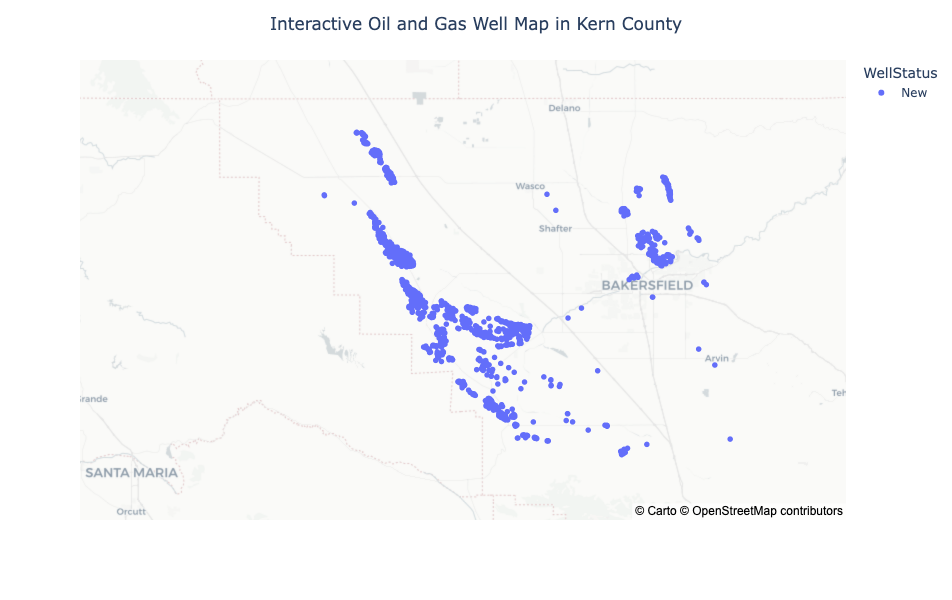

In [41]:
oil_map(oil ='New')

In [42]:
#error references issue of data length (I'm guessing shape of data) but unclear about it  
for WellStatus in pollute:
    oil_map(pollute)

ValueError: ('Lengths must match to compare', (147958,), (3,))

In [51]:
gdf = gpd.read_file('data/CES4 Final Shapefile.shp',
                   dtype= {
        'Tract':int,
    }, crs = "EPSG:4326")

In [52]:
#subsetting data to just include Kern county 
gdf_kern = gdf.loc[gdf['County'] == 'Kern']

<AxesSubplot: >

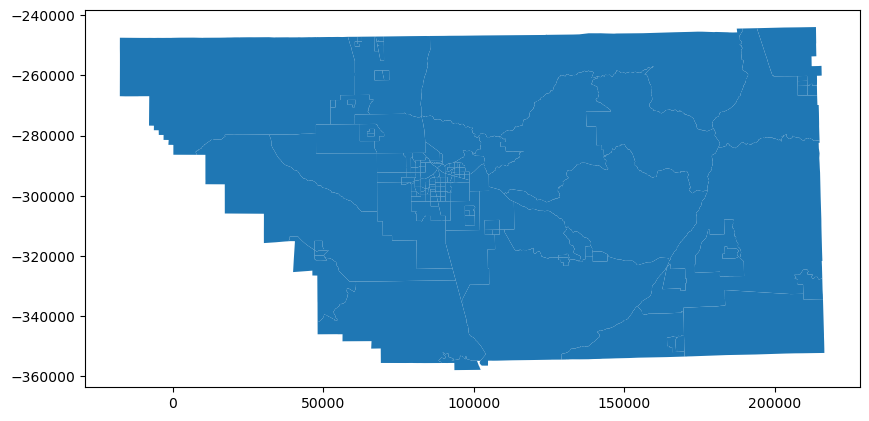

In [53]:
gdf_kern.plot(figsize=(10,10))

In [54]:
gdf_ksub = gdf_kern[['Tract','ZIP', 'County','TotPop19', 'PesticideP', 'Tox_Rel', 'Tox_Rel_P', 'DrinkWat', 
                     'DrinkWatP', 'Lead', 'Lead_P', 'Cleanup', 'CleanupP', 'GWThreat', 'GWThreatP', 
                     'HazWaste', 'HazWasteP', 'ImpWatBod', 'ImpWatBodP', 'SolWaste', 'SolWasteP', 
                     'PollBurd', 'PolBurdSc', 'PolBurdP', 'Asthma', 
                     'AsthmaP', 'LowBirtWt', 'LowBirWP', 'Cardiovas', 'CardiovasP',
         'Poverty','Child_10', 'Pop_10_64', 'Elderly65', 'Hispanic', 'White', 'AfricanAm',
                     'NativeAm', 'OtherMult', 'Shape_Leng', 'Shape_Area', 'AAPI', 'geometry']]

In [55]:
import numpy as np

In [ ]:
#this converts float to an integer which provides actual tract numbers instead of weird notation before
gdf_ksub['Tract'] = gdf_ksub['Tract'].fillna(0).astype(np.int64)
gdf_ksub

In [56]:
gdf_ksub.crs

<Derived Projected CRS: EPSG:3310>
Name: NAD83 / California Albers
Axis Info [cartesian]:
- X[east]: Easting (metre)
- Y[north]: Northing (metre)
Area of Use:
- name: United States (USA) - California.
- bounds: (-124.45, 32.53, -114.12, 42.01)
Coordinate Operation:
- name: California Albers
- method: Albers Equal Area
Datum: North American Datum 1983
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [57]:
gdf_ksub = gdf_ksub.to_crs("EPSG:4326") #reading file with crs 4326 didn't work so this step ensured it changed

In [58]:
gdf_ksub.crs


<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [ ]:
oilcalmerge = gpd.sjoin(gdf_ksub, gdfoil)
oilcalmerge.head(1)

In [ ]:
oilcalmerge.sample